**Including the Data set from the Internet to the tmp Folder**

In [3]:
!wget --no-check-certificate \
    https://storage.googleapis.com/laurencemoroney-blog.appspot.com/horse-or-human.zip \
    -O /tmp/horse-or-human.zip

--2020-06-08 23:48:57--  https://storage.googleapis.com/laurencemoroney-blog.appspot.com/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.111.128, 2607:f8b0:4001:c16::80
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.111.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘/tmp/horse-or-human.zip’

/tmp/horse-or-human 100%[===================>] 142.65M  95.6MB/s    in 1.5s    

2020-06-08 23:48:59 (95.6 MB/s) - ‘/tmp/horse-or-human.zip’ saved [149574867/149574867]



**Unzip the Data Sets**

In [0]:
import os
import zipfile

local_zip='/tmp/horse-or-human.zip'
zip_ref=zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/horse-or-human')
zip_ref.close()

**To read images from subdirectories, and automatically label them from the name of that subdirectory**

In [0]:
# Directory with our training horse pictures
train_horse_dir=os.path.join('/tmp/horse-or-human/horses')

# Directory with our training human pictures
train_human_dir=os.path.join('/tmp/horse-or-human/humans')

**Print the Training Directory Data**

In [6]:
train_horse_names=os.listdir(train_horse_dir)
print(train_horse_names[:10])

train_human_names=os.listdir(train_human_dir)
print(train_human_names[:10])

['horse30-2.png', 'horse23-4.png', 'horse45-3.png', 'horse16-5.png', 'horse24-9.png', 'horse08-1.png', 'horse18-8.png', 'horse27-5.png', 'horse26-2.png', 'horse19-3.png']
['human09-04.png', 'human16-04.png', 'human04-17.png', 'human08-09.png', 'human13-15.png', 'human11-18.png', 'human08-30.png', 'human06-05.png', 'human06-16.png', 'human07-24.png']


**Findout Total No of Horse and Human Images**

In [7]:
print('total training horse images',len(train_horse_names))
print('total training human images',len(train_human_names))

total training horse images 500
total training human images 527


**Visualize the Images**

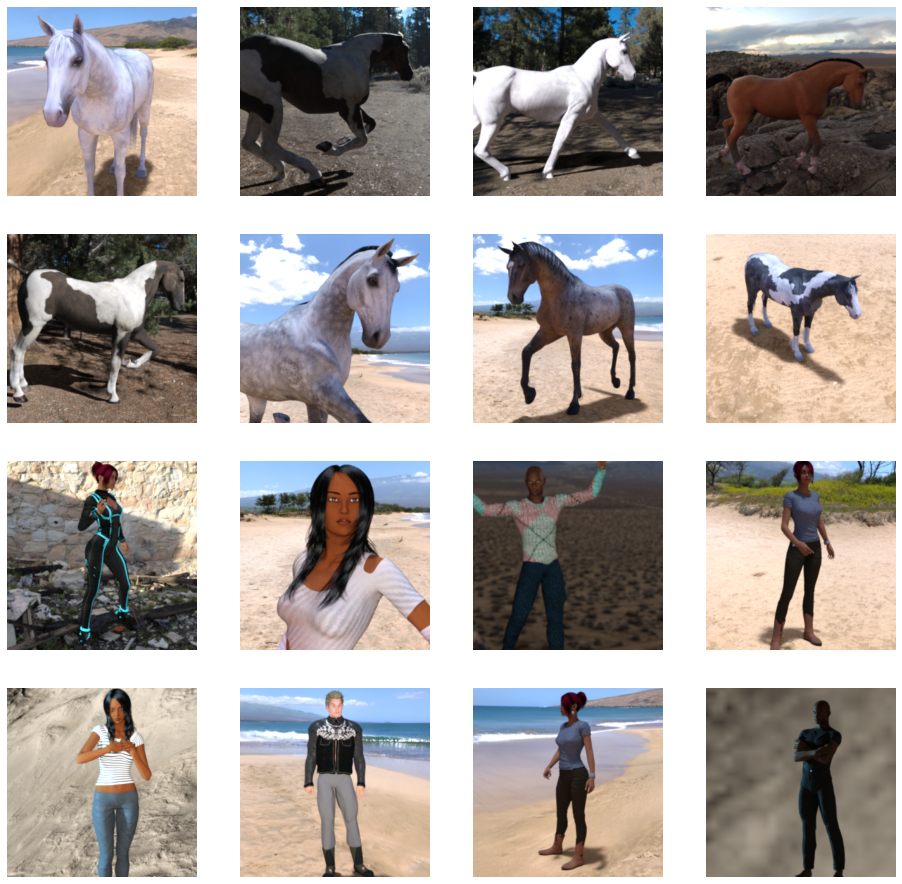

In [8]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Output the images in 4 X 4 configuration
nrows=4
ncols=4

# index for iterating over images
pic_index=0

# Set up matplotlib fig, and size it to fit 4X4 pics
fig=plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index+=8;

next_horse_pix=[os.path.join(train_horse_dir, fname) for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix=[os.path.join(train_human_dir, fname) for fname in train_human_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  # set up subplot starting index at 1
  sp=plt.subplot(nrows, ncols, i+1)
  sp.axis('off')

  img=mpimg.imread(img_path)
  plt.imshow(img)
plt.show()

**Model Building using Tensor Flow**

In [9]:
# step 1: import tensor flow
import tensorflow as tf

# step 2: create densely connected layers
model=tf.keras.models.Sequential([
                                  # the input shape is the desired size of the image 300x300 with 3 bytes color
                                  # the first convolution layer
                                  tf.keras.layers.Conv2D(16,(3,3),activation='relu',input_shape=(300,300,3)),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the second convolution layer
                                  tf.keras.layers.Conv2D(32,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the third convolution layer
                                  tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the fourth convolution layer
                                  tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the fifth convolution layer
                                  tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # flatten the layer to feed into the DNN
                                  tf.keras.layers.Flatten(),
                                  # 512 neurons hidden layers
                                  tf.keras.layers.Dense(512, activation='relu'),
                                  # only the one output layer that will be a value from 0-1 where 0 is for 'horses' and 1 is for 'humans'
                                  tf.keras.layers.Dense(1, activation='sigmoid')
])

# step 3: Create a model summary
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 64)        3

**Compile the Model**

In [0]:
# Step - 4: compile the model

# import the desired library
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['accuracy'])

**Data Preprocessing**

In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Images go into the neural networks be normalized to make it amenable for processing by the network
train_datagen=ImageDataGenerator(rescale=1/255)

# Flow the training images as a batch 
train_generator=train_datagen.flow_from_directory(
        '/tmp/horse-or-human/',  # the source directory for training the images
         target_size=(300,300),  # All the images will be resized as the model
         batch_size=128,
         class_mode='binary'     # binary_crossentropy is used as loss
         )

Found 1027 images belonging to 2 classes.


**Training**

In [12]:
history=model.fit(
    train_generator,
    steps_per_epoch=8,
    epochs=15,
    verbose=1    
)

Epoch 1/15
8/8 [==============================] - 65s 8s/step - loss: 1.6622 - accuracy: 0.5740
Epoch 2/15
8/8 [==============================] - 65s 8s/step - loss: 0.8008 - accuracy: 0.6574
Epoch 3/15
8/8 [==============================] - 76s 10s/step - loss: 0.6506 - accuracy: 0.6826
Epoch 4/15
8/8 [==============================] - 66s 8s/step - loss: 0.4881 - accuracy: 0.7564
Epoch 5/15
8/8 [==============================] - 64s 8s/step - loss: 0.3475 - accuracy: 0.8343
Epoch 6/15
8/8 [==============================] - 64s 8s/step - loss: 0.2656 - accuracy: 0.8799
Epoch 7/15
8/8 [==============================] - 65s 8s/step - loss: 2.5267 - accuracy: 0.8109
Epoch 8/15
8/8 [==============================] - 65s 8s/step - loss: 0.1563 - accuracy: 0.9533
Epoch 9/15
8/8 [==============================] - 66s 8s/step - loss: 0.1403 - accuracy: 0.9533
Epoch 10/15
8/8 [==============================] - 66s 8s/step - loss: 0.0771 - accuracy: 0.9733
Epoch 11/15
8/8 [=====================

**To Upload the Image for the Predicton**

In [16]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded=files.upload()

for fn in uploaded.keys():
  # predicting images
  path='/content/'+fn
  img=image.load_img(path, target_size=(300,300))
  x=image.img_to_array(img)
  x=np.expand_dims(x, axis=0)

  images=np.vstack([x])
  classes=model.predict(images, batch_size=10)
  print(classes[0])
  
  if classes[0]>0.5:
    print(fn+'is a human')
  else:
    print(fn+'is a horse')

Saving girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek.jpg to girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek (1).jpg
[1.]
girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek.jpgis a human


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide


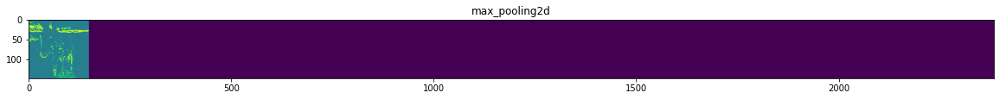

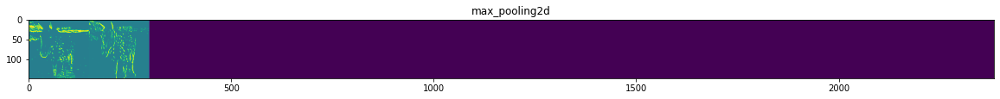

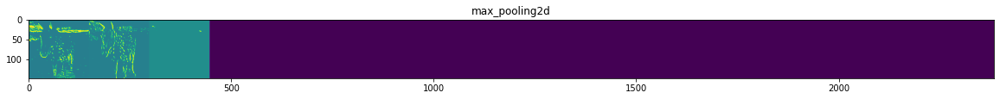

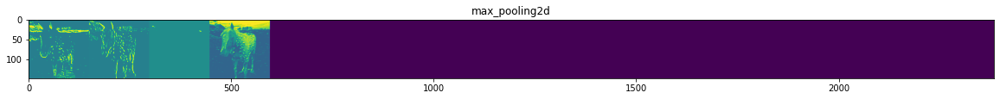

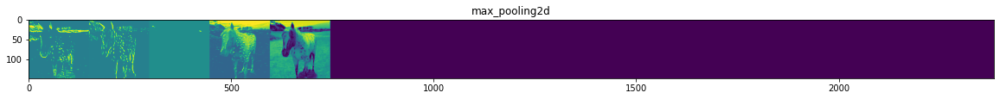

...

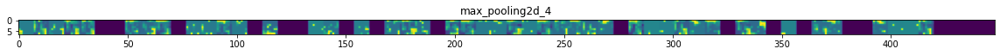

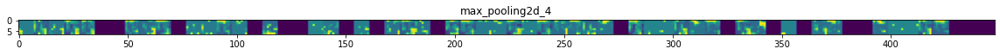

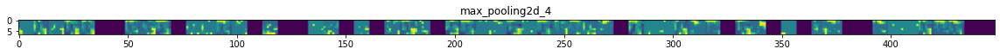

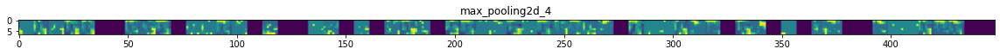

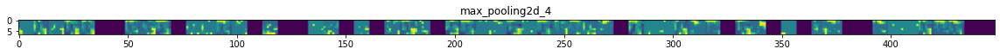

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# The model will take an image as input, and will output intermedicate representation
successive_outputs=[layer.output for layer in model.layers[1:]]

# visualization_model=Model(img_input, successive_outputs)
visualization_model=tf.keras.models.Model(inputs=model.input, outputs=successive_outputs)

# random input image from the training set
horse_img_files=[os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files=[os.path.join(train_human_dir, f) for f in train_human_names]
img_path=random.choice(horse_img_files+human_img_files)

img=load_img(img_path, target_size=(300, 300)) # for PIL(Python Imaging Library) image
x=img_to_array(img) # numpy with the shape as input
x=x.reshape((1,)+x.shape) # numpy array with the shape (1, 300, 300, 3)

# rescale x
x/=255

# network for the intermediate representation of the images
successive_feature_maps=visualization_model.predict(x)

# The names of the layers as part of the plot
layer_names=[layer.name for layer in model.layers[1:]]

# Display the representation
for layer_name, feature_map in zip(layer_names,successive_feature_maps):
  if len(feature_map.shape)==4:
    # for the con / maxpool layers, not the fully connected layers
    n_features=feature_map.shape[-1] # no of features in feature map
    # the feature map has shape(1, size, size, n_features)
    size=feature_map.shape[1]
    # title the image in the matrix
    display_grid=np.zeros((size, size*n_features))
    for i in range(n_features):
      # postprocess the feature to make it visible
      x=feature_map[0,:,:,i]
      x-=x.mean()
      x/=x.std()
      x*=64
      x+=128
      x=np.clip(x,0,255).astype('uint8')
      # Tile each filter into the big horizontal grid
      display_grid[:,i*size:(i+1)*size]=x
      # Display the grid
      scale=20./n_features
      plt.figure(figsize=(scale*n_features, scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid,aspect='auto', cmap='viridis')